# Colon Cell Typing Figure


In [1]:
from tifffile import imread
import geopandas as gpd
import pandas as pd
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import seaborn as sns
from itertools import combinations
import os 
os.makedirs('cell_type_fig', exist_ok=True)
import anndata
from sklearn.cluster import KMeans
import numpy as np
import scanpy as sc
from shapely import wkt
from shapely.geometry import Point, box
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.lines import Line2D
import math
import matplotlib.cm as cm
import matplotlib.colors as mcolors


In [2]:
method_map = {
    'naive_8um': 'Naive 8um',
    'stardist_proximity': 'StarDist + Proximity',
    'stardist_voronoi': 'StarDist + Mask + Voronoi',
    'nuc_stardist': 'StarDist Nuclei',
    'cellpose_proximity': 'Cellpose + Proximity',
    'cellpose_voronoi': 'Cellpose + Mask + Voronoi',
    'cyto_cellpose': 'Cellpose3 Cytoplasm',
    'nuc_cellpose': 'Cellpose Nuclei',
    'cyto_bin2cell': 'Bin2Cell Cytoplasm',
    'stp_tuned': 'STP Tuned',
    'stp_untuned': 'STP Untuned',
}

tissue_map = {
    'mouse_brain': 'Mouse Brain',
    'mouse_embryo': 'Mouse Embryo',
    'mouse_kidney': 'Mouse Kidney',
    'mouse_intestine': 'Mouse Intestine',
    'human_lung': 'Human Lung',
    'human_colon': 'Human Colon'
}

In [3]:
def gini(array):
    array = np.array(array, dtype=np.float64)
    print(array)
    array = array[array > 0] 
    if len(array) == 0:
        return 0.0
    array.sort()
    n = len(array)
    cumulative = np.cumsum(array)
    return (n + 1 - 2 * np.sum(cumulative) / cumulative[-1]) / n


# Comparison Workflow

In [4]:
# No STP due to memory constraints
path = "/uufs/chpc.utah.edu/common/home/u1531817/20250523_cell_seg_eval/analysis/human_colon/med_human_colon_run"
cellpose_proximity = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_cellpose_proximity_adata.h5ad'))
cellpose_voronoi = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_cellpose_voronoi_adata.h5ad'))
stardist_proximity = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_stardist_proximity_adata.h5ad'))
stardist_voronoi = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_stardist_voronoi_adata.h5ad'))
nuc_cellpose = anndata.read_h5ad(os.path.join(path, 'nuc_filtered_cellpose_adata.h5ad'))
nuc_stardist = anndata.read_h5ad(os.path.join(path, 'nuc_filtered_stardist_adata.h5ad'))
cyto_bin2cell = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_bin2cell_adata.h5ad'))
naive_8um = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_naive_8um_adata.h5ad'))
cellpose_cyto = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_cellpose_adata.h5ad'))

datasets = {
    'naive_8um' : naive_8um,
    'cellpose_proximity': cellpose_proximity,
    'cellpose_voronoi': cellpose_voronoi,
    'stardist_proximity': stardist_proximity,
    'stardist_voronoi': stardist_voronoi,
    'nuc_cellpose': nuc_cellpose,
    'nuc_stardist': nuc_stardist,
    'cyto_bin2cell': cyto_bin2cell,
    'cyto_cellpose': cellpose_cyto
}

/uufs/chpc.utah.edu/common/home/clementm-group1/conda/mambaforge/envs/jl_snakemake_env2.0/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/uufs/chpc.utah.edu/common/home/clementm-group1/conda/mambaforge/envs/jl_snakemake_env2.0/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/uufs/chpc.utah.edu/common/home/clementm-group1/conda/mambaforge/envs/jl_snakemake_env2.0/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/uufs/chpc.utah.edu/common/home/clementm-group1/conda/mambaforge/envs/jl_snakemake_env2.0/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: U

In [5]:
tumor_genes = ['CEACAM6', 'NKD1', 'KRT23']
goblet_genes = ['FCGBP', 'MUC2', 'CLCA1']
fibroblast_genes = ['COL1A1', 'MMP2']
macrophage_genes = ['C1QC', 'LYZ', 'CD68']

gini_score_dict = {}
k = 5 # number of clusters
b2c_adata = None
SD_adata = None
SD_V_adata = None

for name, adata in datasets.items():    
    # Ensure var_names are unique
    adata.var_names_make_unique()
    
    sc.pp.pca(adata, n_comps=25)

    # Fit KMeans
    kmeans = KMeans(n_clusters=k, random_state=0)

    X = adata.obsm['X_pca']  # shape (n_cells, n_components)

    adata.obs['kmeans'] = kmeans.fit_predict(X).astype(str)

    # Function to filter valid genes
    def filter_genes(gene_list, adata):
        return [gene for gene in gene_list if gene in adata.var_names]

    # Cleaned gene lists
    tumor_genes = filter_genes(['CEACAM6', 'NKD1', 'KRT23'], adata)
    goblet_genes = filter_genes(['FCGBP', 'MUC2', 'CLCA1'], adata)
    fibroblast_genes = filter_genes(['COL1A1', 'MMP2'], adata)
    macrophage_genes = filter_genes(['C1QC', 'LYZ', 'CD68'], adata)

    # Warn if any missing
    def warn_missing(all_genes, valid_genes, label):
        missing = set(all_genes) - set(valid_genes)
        if missing:
            print(f"⚠️ Missing {label} genes: {missing}")

    warn_missing(['CEACAM6', 'NKD1', 'KRT23'], tumor_genes, "tumor")
    warn_missing(['FCGBP', 'MUC2', 'CLCA1'], goblet_genes, "goblet")
    warn_missing(['COL1A1', 'MMP2'], fibroblast_genes, "fibroblast")
    warn_missing(['C1QC', 'LYZ', 'CD68'], macrophage_genes, "macrophage")

    # Sum expression for each marker gene group
    adata.obs['tumor_expression'] = adata[:, tumor_genes].X.sum(axis=1)
    adata.obs['goblet_expression'] = adata[:, goblet_genes].X.sum(axis=1)
    adata.obs['fibroblast_expression'] = adata[:, fibroblast_genes].X.sum(axis=1)
    adata.obs['macrophage_expression'] = adata[:, macrophage_genes].X.sum(axis=1)

    # Log2 normalize
    for col in ['tumor_expression', 'goblet_expression', 'fibroblast_expression', 'macrophage_expression']:
        adata.obs[col] = np.log2(adata.obs[col] + 1)
    
    if name == 'cyto_bin2cell':
        b2c_adata = adata.copy()
    if name == 'nuc_stardist':
        SD_adata = adata.copy()
    if name == 'stardist_voronoi':
        SD_V_adata = adata.copy()

    # Melt the data
    melted_data = adata.obs.melt(
        id_vars=['kmeans'], 
        value_vars=['tumor_expression', 'goblet_expression', 'fibroblast_expression', 'macrophage_expression'],
        var_name='Gene Group', 
        value_name='Expression'
    )
    # Compute Gini scores
    gini_scores = (
        melted_data
        .groupby('Gene Group')
        .apply(lambda df: gini(df.groupby('kmeans')['Expression'].mean()))
        .reset_index()
        .rename(columns={0: 'Gini Score'})
    )

    # Save Gini scores to a new dict
    gini_score_dict[name] = gini_scores.set_index('Gene Group')['Gini Score'].to_dict()

# Convert the Gini score dictionary to a DataFrame for better visualization
gini_df = pd.DataFrame(gini_score_dict).T
gini_df.index.name = 'Segmentation Method'
gini_df.columns.name = 'Gene Group'


[0.6646238  0.05555491 0.10160557 1.48607783 0.05390245]
[0.02284652 1.32671016 0.01775058 0.00727878 1.44564867]
[0.16381364 0.05278313 0.08287264 0.13050281 0.06106208]
[0.25634347 0.08632633 0.01011885 0.02653374 0.05016535]


/tmp/ipykernel_407692/3210696689.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: gini(df.groupby('kmeans')['Expression'].mean()))


[0.03561583 2.03403586 0.56219981 1.12817611 0.31005943]
[1.79237642 0.0052802  0.21866062 0.03593203 0.44775629]
[0.05132544 0.26900793 0.33349521 0.28971274 0.27371423]
[0.08451069 0.04649685 0.03380578 0.0146918  0.28435096]


/tmp/ipykernel_407692/3210696689.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: gini(df.groupby('kmeans')['Expression'].mean()))


[0.55736909 0.29113205 2.77333296 0.27513296 1.16857898]
[0.03542745 2.64319793 0.02485233 2.64429112 0.43261891]
[0.37189348 0.2976796  0.97894725 0.30767864 0.93158406]
[1.88240893 0.43789613 0.23279468 0.23402957 0.20319411]


/tmp/ipykernel_407692/3210696689.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: gini(df.groupby('kmeans')['Expression'].mean()))


[0.15251217 0.56725998 0.72588396 1.92708212 0.35114708]
[0.37604415 0.03997634 0.04557876 0.00450007 0.2606118 ]
[0.13081305 0.25942025 0.22594517 0.21092162 0.25922457]
[0.44976631 0.01523518 0.01491897 0.04157264 0.02476421]


/tmp/ipykernel_407692/3210696689.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: gini(df.groupby('kmeans')['Expression'].mean()))


[0.23540206 0.4707774  0.94648286 0.09737634 2.19602781]
[0.01599034 0.26974632 0.05868497 1.907847   0.00741283]
[0.18959955 0.37829807 0.3120487  0.10634592 0.33155455]
[0.7553207  0.03506617 0.02191961 0.12553463 0.07257025]
[0.4567048  0.19241335 1.70127455 0.77041258 0.02356832]
[0.09949151 0.42462542 0.00215266 0.02157098 1.34384155]
[0.20973361 0.15041436 0.1647489  0.17415496 0.03549559]
[0.01475706 0.14697016 0.02316224 0.00661265 0.05345913]


/tmp/ipykernel_407692/3210696689.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: gini(df.groupby('kmeans')['Expression'].mean()))
/tmp/ipykernel_407692/3210696689.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: gini(df.groupby('kmeans')['Expression'].mean()))


[0.03548385 1.67252975 0.36027977 0.17450404 0.17721695]
[0.28194913 0.00325484 0.0247103  0.10770834 0.08011895]
[0.01874922 0.07825771 0.46209666 0.09696107 0.11309094]
[0.3076552  0.01475696 0.03428923 0.0091707  0.0274292 ]


/tmp/ipykernel_407692/3210696689.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: gini(df.groupby('kmeans')['Expression'].mean()))


[0.08274264 2.02320107 0.84283154 0.22804694 0.55235151]
[1.88896259 0.00791491 0.05989332 0.01514018 0.21992668]
[0.09535669 0.27210706 0.27970759 0.15946544 0.35147525]
[0.11277604 0.05578728 0.01886895 0.73435928 0.02958486]


/tmp/ipykernel_407692/3210696689.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: gini(df.groupby('kmeans')['Expression'].mean()))


[1.10107265 0.25856711 0.52123823 0.08081909 0.45040781]
[0.01381676 0.11497819 0.03684833 0.93632186 0.02825493]
[0.16956326 0.15073022 0.20937157 0.05910809 0.20402522]
[0.02174827 0.01258311 0.11700184 0.19778646 0.01039559]


/tmp/ipykernel_407692/3210696689.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: gini(df.groupby('kmeans')['Expression'].mean()))


In [6]:
cell_map = {
    'tumor_expression': 'Tumor Cells',
    'goblet_expression': 'Goblet Cells',
    'fibroblast_expression': 'Fibroblasts',
    'macrophage_expression': 'Macrophages'
}

microns_per_pixel = 0.2738242950835738


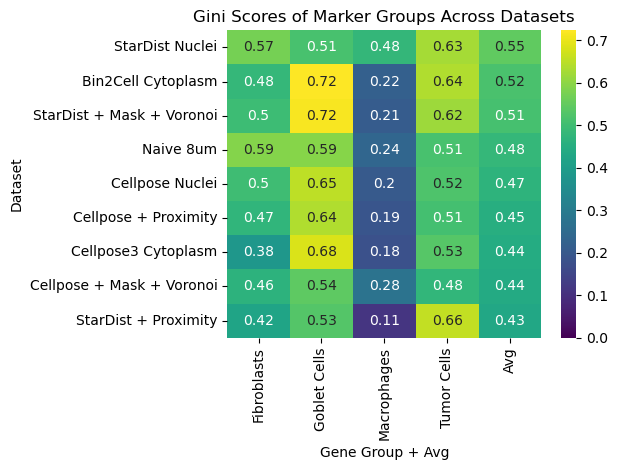

In [7]:
from matplotlib.patches import Rectangle

# calculate avg
gini_df.index = gini_df.index.map(method_map)
gini_df.columns = gini_df.columns.map(cell_map)
gini_df['Avg'] = gini_df.mean(axis=1)

# sort rows by Avg (descending)
gini_df = gini_df.sort_values('Avg', ascending=False)

# Plot
sns.heatmap(
    gini_df, 
    annot=True, 
    cmap='viridis', 
    vmin=0, 
    vmax=gini_df.drop(columns=['Avg']).max().max()) 

plt.title('Gini Scores of Marker Groups Across Datasets')
plt.ylabel('Dataset')
plt.xlabel('Gene Group + Avg')
plt.tight_layout()
plt.savefig('cell_type_fig/human_colon_gini_heatmap.pdf')
plt.show()

In [8]:
# Plot tissue and segmentation colored by cluster 
region_x = [56000, 58000]
region_y = [10500, 12500]

col_img = imread("/uufs/chpc.utah.edu/common/home/u1531817/20250523_cell_seg_eval/data/human_colon/Visium_HD_Human_Colon_Cancer_tissue_image.btf")
cropped_img = col_img[region_y[0]:region_y[1], region_x[0]:region_x[1]]

# forgot to join geometries into adata so doing that now 
SD_gdf = gpd.read_file('/uufs/chpc.utah.edu/common/home/u1531817/20250523_cell_seg_eval/analysis/human_colon/med_human_colon_run/stardist_nuclei.gpkg')
SD_V_gdf = gpd.read_file('/uufs/chpc.utah.edu/common/home/u1531817/20250523_cell_seg_eval/analysis/human_colon/med_human_colon_run/stardist_voronoi_cyto.gpkg')

SD_adata.obs.set_index('id', inplace=True)
SD_gdf = SD_gdf[['id', 'geometry']].set_index('id')
SD_adata.obs = SD_adata.obs.join(SD_gdf, on='id', how='left')

SD_V_gdf.rename(columns={'cell_id': 'id'}, inplace=True)
SD_V_gdf.reset_index(inplace=True)
SD_V_gdf = SD_V_gdf[['id', 'geometry']].set_index('id')
SD_V_adata.obs = SD_V_adata.obs.join(SD_V_gdf, on='id', how='left')

# convert back to polygons
b2c_adata.obs['geometry'] = b2c_adata.obs['geometry'].apply(wkt.loads)

b2c_gdf = gpd.GeoDataFrame(b2c_adata.obs[['kmeans', 'tumor_expression', 'goblet_expression', 'fibroblast_expression', 'macrophage_expression']], geometry=b2c_adata.obs['geometry'])
SD_gdf = gpd.GeoDataFrame(SD_adata.obs[['kmeans', 'tumor_expression', 'goblet_expression', 'fibroblast_expression', 'macrophage_expression']], geometry=SD_adata.obs['geometry'])
SD_V_gdf = gpd.GeoDataFrame(SD_V_adata.obs[['kmeans', 'tumor_expression', 'goblet_expression', 'fibroblast_expression', 'macrophage_expression']], geometry=SD_V_adata.obs['geometry'])


In [ ]:
plots_dict= {'b2c':b2c_gdf, 'SD':SD_gdf, 'SD_V':SD_V_gdf}


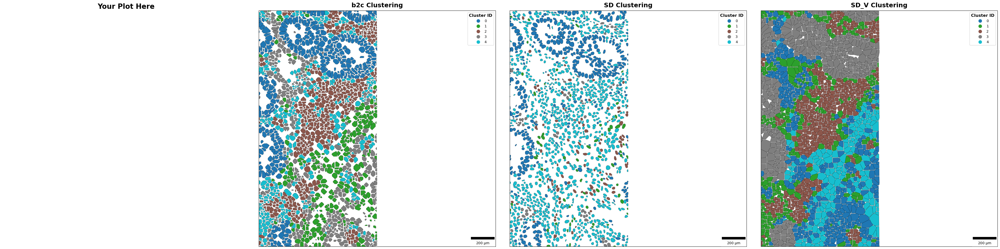

In [ ]:

# --- Create a single figure with 4 subplots in a row ---
fig, axes = plt.subplots(1, 4, figsize=(40, 10))
microns_per_pixel = 1  # change this if needed

# leave first plot empty
axes[0].axis('off')
axes[0].set_title("", fontsize=20, weight='bold')

# iterate through your 3 plots
for ax, (name, gdf) in zip(axes[1:], plots_dict.items()):

    gdf.plot(
        column='kmeans',
        cmap='tab10',
        linewidth=0.3,
        edgecolor='black',
        legend=True,
        ax=ax
    )

    ax.set_title(f"{name} Clustering", fontsize=18, weight='bold', pad=10)
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')

    # scalebar
    scalebar = ScaleBar(
        dx=microns_per_pixel,
        units='µm',
        location='lower right',
        scale_loc='bottom',
        color='black',
        box_alpha=0.7
    )
    ax.add_artist(scalebar)

    # legend cleanup
    leg = ax.get_legend()
    if leg:
        leg.set_title("Cluster ID", prop={'size': 12, 'weight': 'bold'})
        for txt in leg.get_texts():
            txt.set_fontsize(10)

    # consistent region
    ax.set_xlim(region_x[0], region_x[1])
    ax.set_ylim(region_y[0], region_y[1])

plt.tight_layout()
plt.savefig("cluster_comparison.pdf", dpi=300, bbox_inches='tight')
plt.show()

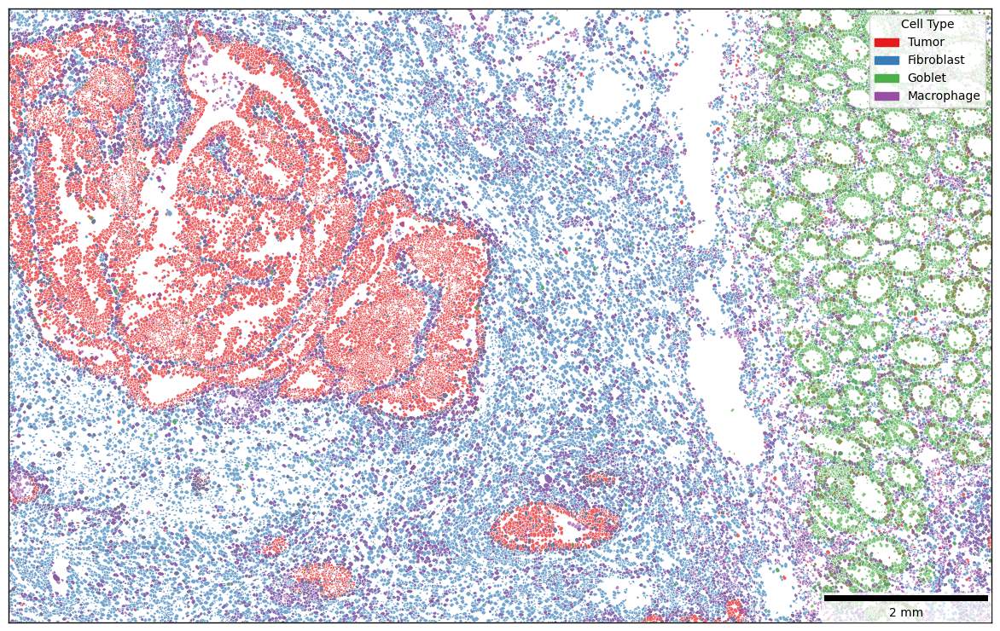

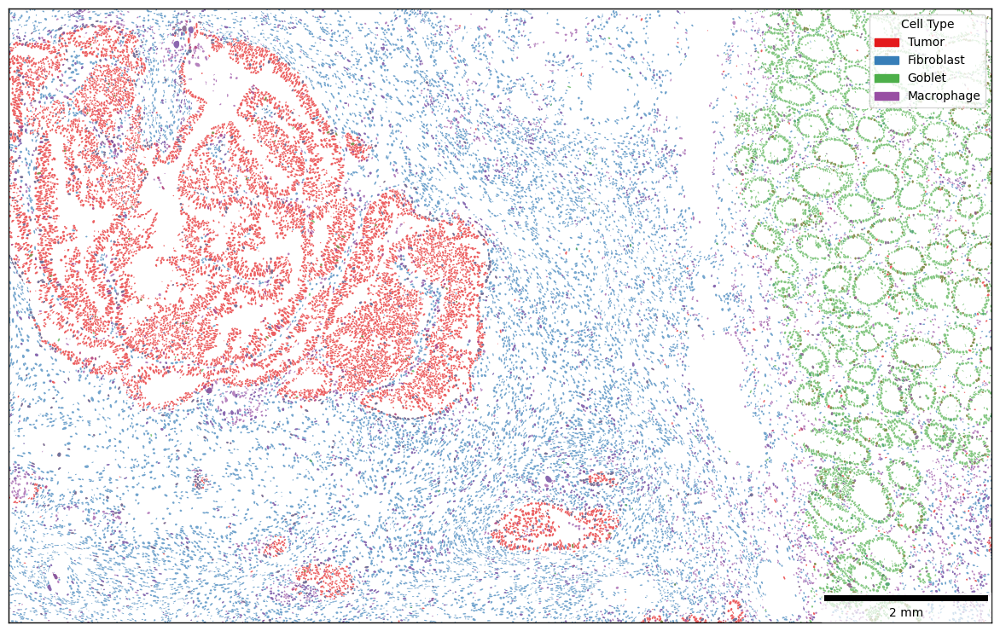

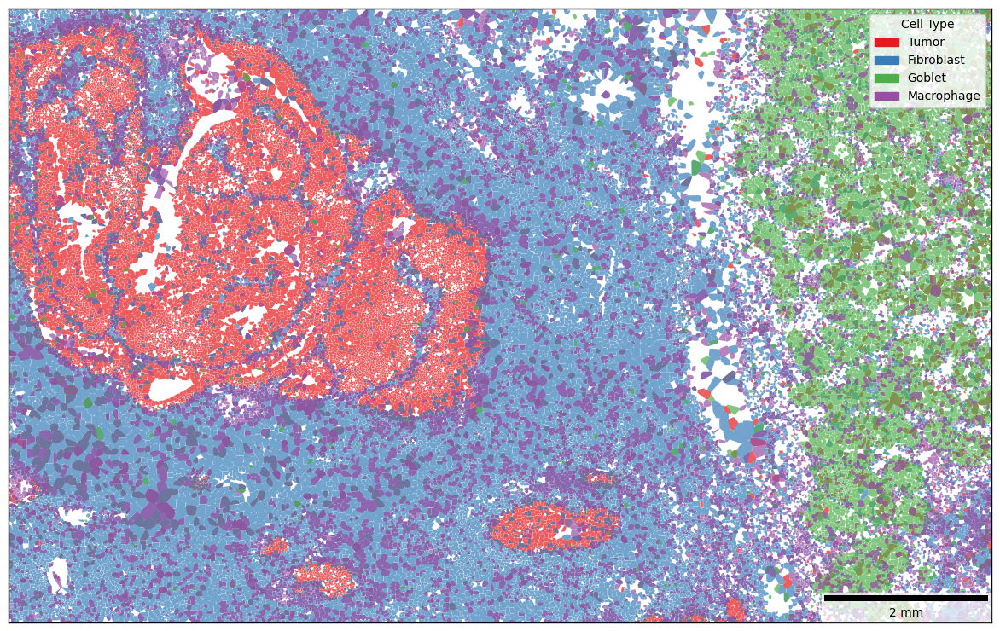

In [11]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib.patches as mpatches


# Limits based on crop
xlims = [45000, 57000]
ylims = [10000, 17500]

# Define cell type columns and colors
expr_cols = [
    ("tumor_expression", "Tumor"),
    ("fibroblast_expression", "Fibroblast"),
    ("goblet_expression", "Goblet"),
    ("macrophage_expression", "Macrophage"),
]

# plot function
def plot_cell_type_expression(gdf, sample):
    fig, ax = plt.subplots(figsize=(12, 7.5))

    # Assign a distinct color for each cell type
    colors = ["#e41a1c", "#377eb8", "#4daf4a", "#984ea3"]
    for (col, label), color in zip(expr_cols, colors):
        gdf[gdf[col] > 0].plot(
            ax=ax,
            color=color,
            markersize=20,
            alpha=0.7,
            linewidth=0
        )

    # Manually create legend handles
    handles = [mpatches.Patch(color=color, label=label) for (_, label), color in zip(expr_cols, colors)]
    ax.legend(handles=handles, title="Cell Type")

    # Add scalebar
    scalebar = ScaleBar(
        dx=microns_per_pixel,        
        units='µm',                  
        location='lower right',      
        scale_loc='bottom',         
        color='black',               
        box_alpha=0.7)
    ax.add_artist(scalebar)

    # Crop and clean axes
    ax.set_xlim(xlims)
    ax.set_ylim(ylims)
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color("black")
        spine.set_linewidth(1)


    plt.tight_layout()
    plt.savefig(f"cell_type_fig/{sample}_combined_expression.pdf", dpi=300, bbox_inches='tight')
    plt.show()

# Generate plots for each dataset
plot_cell_type_expression(b2c_gdf, "b2c_cytoplasm")
plot_cell_type_expression(SD_gdf, "SD_nuclei")
plot_cell_type_expression(SD_V_gdf, "SD_V_cytoplasm")


/tmp/ipykernel_407692/3360156194.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_407692/3360156194.py:50: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels([cell_map[ct] for ct in ordered_types], rotation=45)
/tmp/ipykernel_407692/3360156194.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_407692/3360156194.py:50: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i].set_xticklabels([cell_map[ct] for ct in ordered_types], rotation=45)
/tmp/ipykernel_407692/3360156194

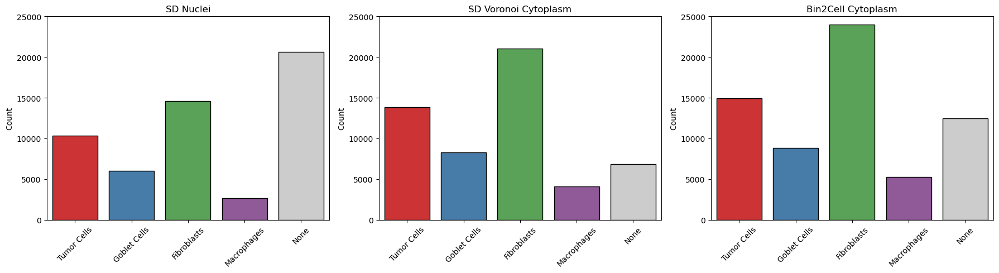

In [12]:
def assign_cell_types_plot_three(gdf1, gdf2, gdf3, names):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd

    expr_cols = ['tumor_expression', 'goblet_expression', 'fibroblast_expression', 'macrophage_expression']

    # Clean cell type names
    cell_map = {
        'tumor_expression': 'Tumor Cells',
        'goblet_expression': 'Goblet Cells',
        'fibroblast_expression': 'Fibroblasts',
        'macrophage_expression': 'Macrophages',
        'None': 'None'
    }

    # Colors mapped to the SAME order
    color_map = {
        'tumor_expression': "#e41a1c",
        'goblet_expression': "#377eb8",
        'fibroblast_expression': "#4daf4a",
        'macrophage_expression': "#984ea3",
        'None': "#cccccc"   # gray for None
    }

    gdfs = [gdf1, gdf2, gdf3]

    fig, axs = plt.subplots(1, 3, figsize=(18, 5))  # 3 barplots side by side

    for i, gdf in enumerate(gdfs):
        # Assign max expression type
        gdf['cell_type'] = gdf[expr_cols].idxmax(axis=1)
        gdf.loc[gdf[expr_cols].sum(axis=1) == 0, 'cell_type'] = "None"

        # Desired order
        ordered_types = expr_cols + ["None"]
        counts = [(gdf['cell_type'] == ct).sum() for ct in ordered_types]
        colors = [color_map[ct] for ct in ordered_types]

        sns.barplot(
            x=[cell_map[ct] for ct in ordered_types],
            y=counts,
            palette=colors,
            edgecolor="black",
            ax=axs[i]
        )
        axs[i].set_title(f"{names[i]}")
        axs[i].set_ylabel("Count")
        axs[i].set_ylim(0, 25000)
        axs[i].set_xticklabels([cell_map[ct] for ct in ordered_types], rotation=45)

    plt.tight_layout()
    plt.savefig("cell_type_fig/three_datasets_cell_type_counts.pdf", dpi=300, bbox_inches='tight')
    plt.show()

assign_cell_types_plot_three(SD_gdf, SD_V_gdf, b2c_gdf, ['SD Nuclei', 'SD Voronoi Cytoplasm', 'Bin2Cell Cytoplasm'])

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'MATH': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'F', 'G', 'M', 'N', 'S', 'T', 'V', 'a', 'b', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 38, 39, 41, 42, 48, 49, 54, 55, 57, 68, 69, 70, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 92]
Closed glyph list over 'MATH': 43 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'F', 'G', 'M', 'N', 'S', 'T', 'V', 'a', 'b', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', '

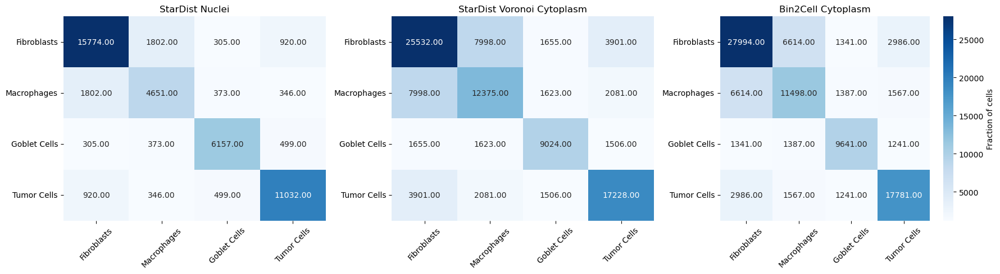

In [ ]:
def heatmap_three(gdf1, gdf2, gdf3, names):
    expr_cols = ['fibroblast_expression', 'macrophage_expression', 'goblet_expression', 'tumor_expression']

    # Map for clean cell type names
    cell_map = {
        'tumor_expression': 'Tumor Cells',
        'goblet_expression': 'Goblet Cells',
        'fibroblast_expression': 'Fibroblasts',
        'macrophage_expression': 'Macrophages'
    }

    gdfs = [gdf1, gdf2, gdf3]

    fig, axs = plt.subplots(1, 3, figsize=(18, 5))  # 3 heatmaps side by side

    for i, gdf in enumerate(gdfs):
        # Binarize expression
        expr_bin = (gdf[expr_cols] > 0).astype(int)

        # Compute co-occurrence fraction
        cooccur_matrix = pd.DataFrame(index=expr_cols, columns=expr_cols, dtype=float)
        n_cells = expr_bin.shape[0]

        for col1 in expr_cols:
            for col2 in expr_cols:
                cooccur_matrix.loc[col1, col2] = ((expr_bin[col1] & expr_bin[col2]).sum())/ n_cells

        # Plot heatmap
        sns.heatmap(
            cooccur_matrix,
            annot=True,
            fmt=".2f",
            cmap="Blues",
            cbar=i == 2,  # show colorbar only on last subplot
            ax=axs[i],
            cbar_kws={'label': 'Fraction of cells'}
        )
        axs[i].set_title(f"{names[i]}")
        axs[i].set_yticklabels([cell_map[c] for c in expr_cols], rotation=0)
        axs[i].set_xticklabels([cell_map[c] for c in expr_cols], rotation=45)

    plt.tight_layout()
    plt.savefig(f"cell_type_fig/three_datasets_cooccurrence_heatmap.pdf", dpi=300, bbox_inches='tight')
    plt.show()
heatmap_three(SD_gdf, SD_V_gdf, b2c_gdf, ['StarDist Nuclei', 'StarDist Voronoi Cytoplasm', 'Bin2Cell Cytoplasm'])


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'MATH': 45 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'F', 'G', 'M', 'N', 'S', 'T', 'V', 'a', 'b', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 11, 12, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 38, 39, 41, 42, 48, 49, 54, 55, 57, 68, 69, 70, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 92]
Closed glyph list over 'MATH': 51 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'F', 'G', 'M', 'N', 'S', 'T', 'V', 'a', 'b', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'peri

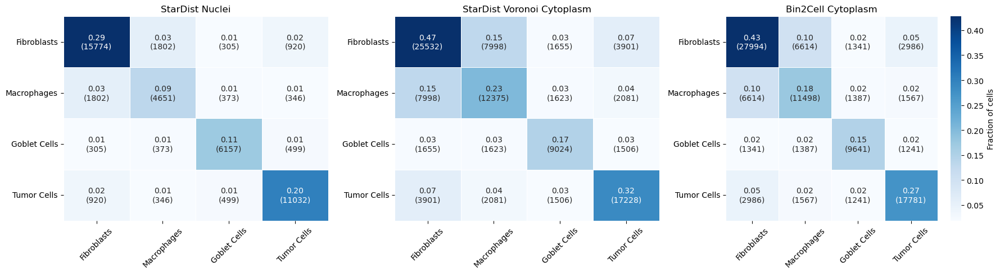

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def heatmap_three_prop_with_counts(gdf1, gdf2, gdf3, names):
    expr_cols = [
        'fibroblast_expression',
        'macrophage_expression',
        'goblet_expression',
        'tumor_expression'
    ]

    cell_map = {
        'tumor_expression': 'Tumor Cells',
        'goblet_expression': 'Goblet Cells',
        'fibroblast_expression': 'Fibroblasts',
        'macrophage_expression': 'Macrophages'
    }

    gdfs = [gdf1, gdf2, gdf3]
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))

    for i, gdf in enumerate(gdfs):
        expr_bin = (gdf[expr_cols] > 0).astype(int)
        n_cells = expr_bin.shape[0]

        # 1. Color matrix = proportion
        color_matrix = pd.DataFrame(
            0.0, index=expr_cols, columns=expr_cols
        )
        # 2. Annotation matrix = counts
        annot_matrix = pd.DataFrame(
            0, index=expr_cols, columns=expr_cols
        )

        for r, col1 in enumerate(expr_cols):
            for c, col2 in enumerate(expr_cols):
                count = (expr_bin[col1] & expr_bin[col2]).sum()
                prop = count / n_cells
                color_matrix.loc[col1, col2] = prop
                annot_matrix.loc[col1, col2] = count

        # 3. Combine proportion + counts for annotation strings
        annot_labels = np.array([
            f"{color_matrix.values[r, c]:.2f}\n({annot_matrix.values[r, c]})"
            for r in range(len(expr_cols))
            for c in range(len(expr_cols))
        ]).reshape(color_matrix.shape)

        # 4. Plot heatmap
        ax = axs[i]
        sns.heatmap(
            color_matrix,
            annot=annot_labels,
            fmt="",
            cmap="Blues",
            linewidths=0.5,
            cbar=i == 2,
            cbar_kws={'label': 'Fraction of cells'},
            ax=ax
        )

        ax.set_title(names[i])
        ax.set_xticks(np.arange(len(expr_cols)) + 0.5)
        ax.set_yticks(np.arange(len(expr_cols)) + 0.5)
        ax.set_xticklabels([cell_map[c] for c in expr_cols], rotation=45)
        ax.set_yticklabels([cell_map[c] for c in expr_cols], rotation=0)

    plt.tight_layout()
    plt.savefig(
        "cell_type_fig/three_datasets_cooccurrence_prop_counts_heatmap.pdf",
        dpi=300,
        bbox_inches='tight'
    )
    plt.show()

heatmap_three_prop_with_counts(SD_gdf, SD_V_gdf, b2c_gdf, ['StarDist Nuclei', 'StarDist Voronoi Cytoplasm', 'Bin2Cell Cytoplasm'])



# Mouse Brain Cell Typing

In [2]:
import celltypist
from celltypist import models
models.download_models(force_update = True)
models.models_description()

import anndata
import geopandas as gpd
import os

path = '/uufs/chpc.utah.edu/common/home/u1531817/20250523_cell_seg_eval/analysis/mouse_brain/mouse_brain_run/'

cellpose_proximity = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_cellpose_proximity_adata.h5ad'))
cellpose_voronoi = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_cellpose_voronoi_adata.h5ad'))
cellpose_cyto = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_cellpose_adata.h5ad'))
stardist_proximity = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_stardist_proximity_adata.h5ad'))
stardist_voronoi = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_stardist_voronoi_adata.h5ad'))
stp_tuned = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_STP_tuned_adata.h5ad'))
stp_untuned = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_STP_untuned_adata.h5ad'))
nuc_cellpose = anndata.read_h5ad(os.path.join(path, 'nuc_filtered_cellpose_adata.h5ad'))
nuc_stardist = anndata.read_h5ad(os.path.join(path, 'nuc_filtered_stardist_adata.h5ad'))
cyto_bin2cell = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_bin2cell_adata.h5ad'))
naive_8um = anndata.read_h5ad(os.path.join(path, 'cyto_filtered_naive_8um_adata.h5ad'))

datasets_adata = {
    'naive_8um' : naive_8um,
    'cellpose_proximity': cellpose_proximity,
    'cellpose_voronoi': cellpose_voronoi,
    'cellpose_cyto': cellpose_cyto,
    'stardist_proximity': stardist_proximity,
    'stardist_voronoi': stardist_voronoi,
    'stp_tuned': stp_tuned,
    'stp_untuned': stp_untuned,
    'nuc_cellpose': nuc_cellpose,
    'nuc_stardist': nuc_stardist,
    'cyto_bin2cell': cyto_bin2cell
}

cellpose_proximity_gdf = gpd.read_file(os.path.join(path, 'cellpose_proximity_cyto.gpkg'))
cellpose_voronoi_gdf = gpd.read_file(os.path.join(path, 'cellpose_voronoi_cyto.gpkg'))
cellpose_cyto_gdf = gpd.read_file(os.path.join(path, 'cellpose_cyto.gpkg'))
stardist_proximity_gdf = gpd.read_file(os.path.join(path, 'stardist_proximity_cyto.gpkg'))
stardist_voronoi_gdf = gpd.read_file(os.path.join(path, 'stardist_voronoi_cyto.gpkg'))
stp_tuned_gdf = gpd.read_file(os.path.join(path, 'STP_tuned_cyto.gpkg'))
stp_untuned_gdf = gpd.read_file(os.path.join(path, 'STP_untuned_cyto.gpkg'))
nuc_cellpose_gdf = gpd.read_file(os.path.join(path, 'cellpose_nuclei.gpkg'))
nuc_stardist_gdf = gpd.read_file(os.path.join(path, 'stardist_nuclei.gpkg'))
cyto_bin2cell_gdf = gpd.read_file(os.path.join(path, 'bin2cell_cyto.gpkg'))
naive_8um_gdf = gpd.read_file(os.path.join(path, 'naive_8um_cyto.gpkg'))


datasets_gdf = {
    'naive_8um' : naive_8um_gdf,
    'cellpose_proximity': cellpose_proximity_gdf,
    'cellpose_voronoi': cellpose_voronoi_gdf,
    'cellpose_cyto': cellpose_cyto_gdf,
    'stardist_proximity': stardist_proximity_gdf,
    'stardist_voronoi': stardist_voronoi_gdf,
    'stp_tuned': stp_tuned_gdf,
    'stp_untuned': stp_untuned_gdf,
    'nuc_cellpose': nuc_cellpose_gdf,
    'nuc_stardist': nuc_stardist_gdf,
    'cyto_bin2cell': cyto_bin2cell_gdf
}

global_xmin = 14000
global_xmax = 16000
global_ymin = 6500
global_ymax = 8500



📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 60
📂 Storing models in /uufs/chpc.utah.edu/common/home/u1531817/.celltypist/data/models
💾 Downloading model [1/60]: Immune_All_Low.pkl
💾 Downloading model [2/60]: Immune_All_High.pkl
💾 Downloading model [3/60]: Adult_COVID19_PBMC.pkl
💾 Downloading model [4/60]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [5/60]: Adult_Human_MTG.pkl
💾 Downloading model [6/60]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [7/60]: Adult_Human_PrefrontalCortex.pkl
💾 Downloading model [8/60]: Adult_Human_Skin.pkl
💾 Downloading model [9/60]: Adult_Human_Vascular.pkl
💾 Downloading model [10/60]: Adult_Mouse_Gut.pkl
💾 Downloading model [11/60]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [12/60]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [13/60]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [14/60]: Adult_cHSPCs_Illumina.pkl
💾 Downloading model [15/60]: 

In [3]:
# img info
mb_img = imread('/uufs/chpc.utah.edu/common/home/u1531817/20250523_cell_seg_eval/data/mouse_brain/Visium_HD_Mouse_Brain_tissue_image.tif')
cropped_mb_img = mb_img[global_ymin:global_ymax, global_xmin:global_xmax]
microns_per_pixel = 0.2738242950835738 # from metadata

In [4]:
model_name = 'Developing_Mouse_Hippocampus.pkl'
model = models.Model.load(model = model_name)
import matplotlib.pyplot as plt
import pandas as pd
plot_dict = {}
for dataset_name, adata in datasets_adata.items():
    adata.var_names_make_unique()
    predictions = celltypist.annotate(adata, model = model_name, majority_voting = True)
    pred_adata = predictions.to_adata()
    if 'id' in pred_adata.obs.columns:
        if pd.api.types.is_numeric_dtype(pred_adata.obs['id']):
        # Convert numeric IDs to int first, then string
            pred_adata.obs['cell_id'] = pred_adata.obs['id'].astype(int).astype(str)
        else:             
            pred_adata.obs['cell_id'] = pred_adata.obs['id'].astype(str)


    if 'geometry' in pred_adata.obs.columns:
        pred_adata.obs = pred_adata.obs.drop(columns=['geometry'])
    gdf = datasets_gdf[dataset_name]
    if 'id' in gdf.columns:
        gdf['cell_id'] = gdf['id'].astype(str)
    gdf_merged = gdf.merge(pred_adata.obs, on='cell_id', how='left')
    print(f"{dataset_name} predictions:")

    plot_dict[dataset_name] = gdf_merged


⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 4761 cells and 19059 genes
🔗 Matching reference genes in the model
🧬 2412 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 199 cells and 10777 genes
🔗 Matching reference genes in the model


naive_8um predictions:


🧬 1831 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 195 cells and 14404 genes
🔗 Matching reference genes in the model


cellpose_proximity predictions:


🧬 2251 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 504 cells and 12607 genes
🔗 Matching reference genes in the model


cellpose_voronoi predictions:


🧬 2009 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 947 cells and 13682 genes
🔗 Matching reference genes in the model
🧬 2139 features used for prediction


cellpose_cyto predictions:


⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 941 cells and 14417 genes
🔗 Matching reference genes in the model


stardist_proximity predictions:


🧬 2251 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 6545 cells and 19059 genes
🔗 Matching reference genes in the model
🧬 2412 features used for prediction


stardist_voronoi predictions:


⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 22806 cells and 19059 genes
🔗 Matching reference genes in the model


stp_tuned predictions:


🧬 2412 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 199 cells and 19059 genes
🔗 Matching reference genes in the model
🧬 2412 features used for prediction


stp_untuned predictions:


⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 947 cells and 19059 genes
🔗 Matching reference genes in the model
🧬 2412 features used for prediction


nuc_cellpose predictions:


⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 1217 cells and 14095 genes
🔗 Matching reference genes in the model


nuc_stardist predictions:


🧬 2205 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!


cyto_bin2cell predictions:


/tmp/ipykernel_1403928/3374474114.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(all_labels))
/uufs/chpc.utah.edu/common/home/clementm-group1/conda/mambaforge/envs/jl_snakemake_env2.0/lib/python3.10/site-packages/geopandas/geodataframe.py:1981: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 29 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'M', 'P', 'S', 'T', 'a', 'c', 'd', 'e', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 't', 'u', 'y']
Glyph IDs:   [0, 1, 2, 3, 16, 36, 37, 38, 48, 51, 54, 55, 68, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 92]
Closed glyph list over 'GSUB': 29 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'M', 'P', 'S', 'T', 'a', 'c', 'd', 'e', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 't', 'u', 'y']
Glyph IDs:   [0, 1, 2, 3, 16, 36, 37, 38, 48, 51, 54, 55, 68, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 92]
Closing glyph list over 'glyf': 29 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'M', 'P', 'S', 

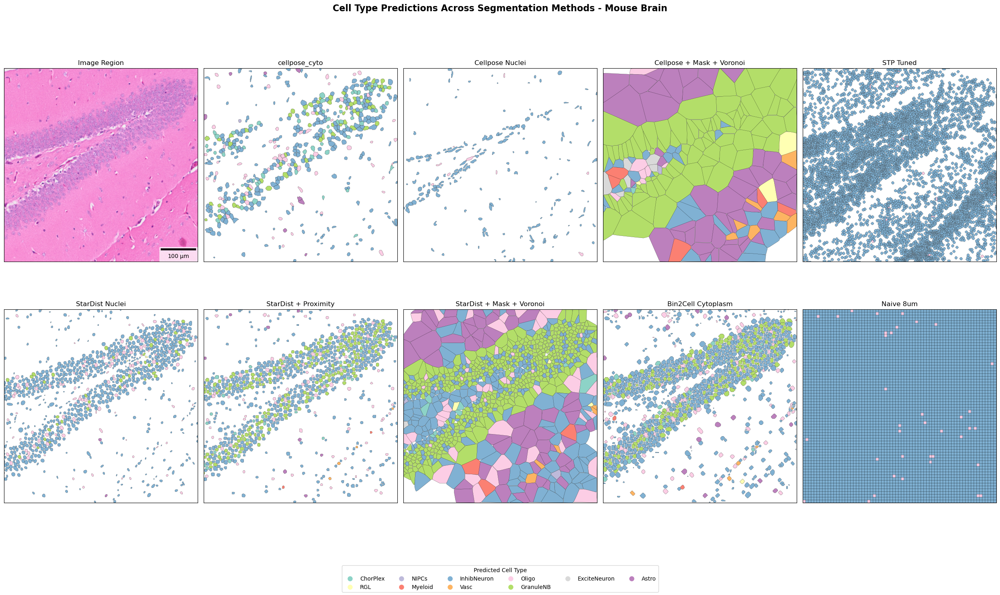

In [20]:
model_name = 'Developing_Mouse_Hippocampus.pkl'
model = models.Model.load(model = model_name)


fig, axes = plt.subplots(2, 5, figsize=(25, 15))

# Plot the img_region in the first subplot
axes[0, 0].imshow(cropped_mb_img, origin='lower')
axes[0, 0].set_title("Image Region")
axes[0, 0].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

scalebar = ScaleBar(
    dx=microns_per_pixel,        
    units='µm',                  
    location='lower right',      
    scale_loc='bottom',         
    color='black',               
    box_alpha=0.7)               

axes[0, 0].add_artist(scalebar)

# visuals to plot
plotting = ['cellpose_cyto','nuc_cellpose','cellpose_voronoi','stp_tuned','nuc_stardist','stardist_proximity','stardist_voronoi','cyto_bin2cell','naive_8um',]

# filter data to only plotting keys
data = {key: plot_dict[key] for key in plotting}

# Get all unique cell types across all plots except any NAs (shouldnt be any)
all_labels = {label for gdf in data.values() for label in gdf['predicted_labels'].unique()}
all_labels = {x for x in all_labels if not (isinstance(x, float) and math.isnan(x))}

# Assign a fixed color to each cell type

cmap = cm.get_cmap('tab20', len(all_labels))


custom_colors = [
    "#8dd3c7",  # teal
    "#ffffb3",  # light yellow
    "#bebada",  # lavender
    "#fb8072",  # coral
    "#80b1d3",  # light blue
    "#fdb462",  # peach/orange
    "#fccde5",  # pink
    "#b3de69",  # light green
    "#d9d9d9",  # light gray
    "#bc80bd"   # purple
    ]



label_color_map = {label: custom_colors[i % len(custom_colors)] for i, label in enumerate(all_labels)}

# Define your desired plotting order
plotting = ['cellpose_cyto','nuc_cellpose','cellpose_voronoi','stp_tuned','nuc_stardist','stardist_proximity','stardist_voronoi','cyto_bin2cell','naive_8um',]

plot_order = ['cellpose_cyto', 'nuc_cellpose', 'cellpose_voronoi',
              'nuc_stardist', 'stardist_proximity','stardist_voronoi', 'cyto_bin2cell', 
              'naive_8um', 'stp_tuned']

# Filter and reorder data according to plot_order
data = {key: plot_dict[key] for key in plotting if key in plot_dict}

# Then your plotting loop stays the same
for i, (key, gdf) in enumerate(data.items()):
    gdf = gdf.dropna(subset=['predicted_labels'])
    row, col = divmod(i + 1, 5)  # +1 keeps axes[0,0] as image
    ax = axes[row, col]
    gdf['color'] = gdf['predicted_labels'].map(label_color_map)
    gdf.plot(color=gdf['color'], ax=ax, edgecolor='black', linewidth=0.2, legend=False)
    ax.set_xlim(global_xmin, global_xmax)
    ax.set_ylim(global_ymin, global_ymax)
    ax.set_title(method_map.get(key, key))
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)



# Set aspect ratio
for ax in axes.flat:
    ax.set_aspect('equal')

# Create a single legend for all cell types
legend_elements = [Line2D([0], [0], marker='o', color='w', label=label,
                          markerfacecolor=color, markersize=10)
                   for label, color in label_color_map.items()]
fig.legend(title="Predicted Cell Type", handles=legend_elements, loc='lower center', ncol=6)
fig.suptitle("Cell Type Predictions Across Segmentation Methods - Mouse Brain", fontsize=16, weight='bold')
plt.tight_layout(rect=[0, 0.05, 1, 1])  
plt.savefig('cell_type_fig/MB_visual.pdf')
plt.show()


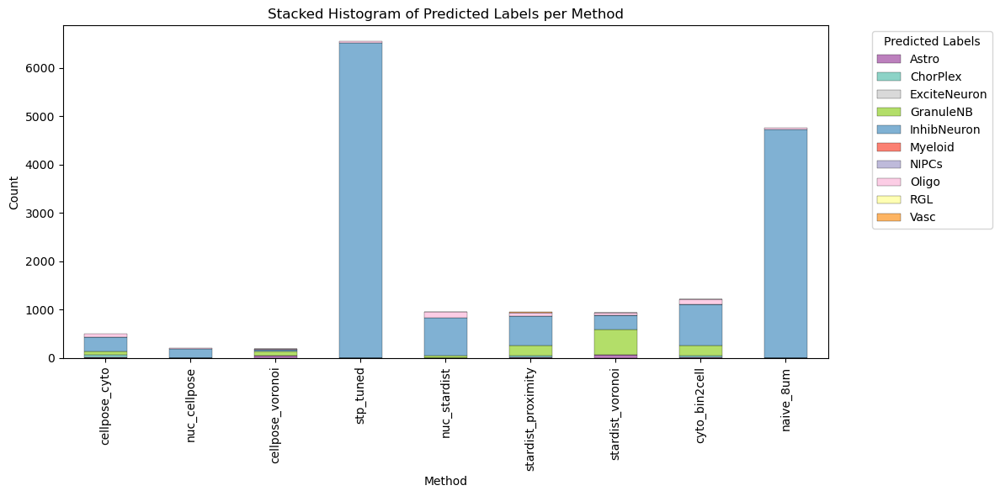

In [21]:
# Collect counts for each method
counts = {}

for key, gdf in data.items():
    gdf = gdf.dropna(subset=['predicted_labels'])
    # count labels for this key
    counts[key] = gdf['predicted_labels'].value_counts()

# Convert to DataFrame
df_counts = pd.DataFrame(counts).fillna(0)

# Ensure consistent stacking order
df_counts = df_counts.sort_index()

# Map colors (same mapping you already use)
colors = df_counts.index.map(label_color_map.get)

# Create plot
fig, ax = plt.subplots(figsize=(12, 6))

df_counts.T.plot(
    kind='bar',
    stacked=True,
    color=[label_color_map[label] for label in df_counts.index],
    ax=ax,
    edgecolor="black",
    linewidth=0.2,
)

ax.set_xlabel("Method")
ax.set_ylabel("Count")
ax.set_title("Stacked Histogram of Predicted Labels per Method")
ax.legend(title="Predicted Labels", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'MATH': 51 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'G', 'I', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'x', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 14, 17, 19, 20, 21, 23, 25, 27, 36, 37, 38, 39, 40, 42, 44, 47, 48, 49, 50, 51, 53, 54, 55, 57, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 91, 92]
Closed glyph list over 'MATH': 51 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'G', 'I', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkin

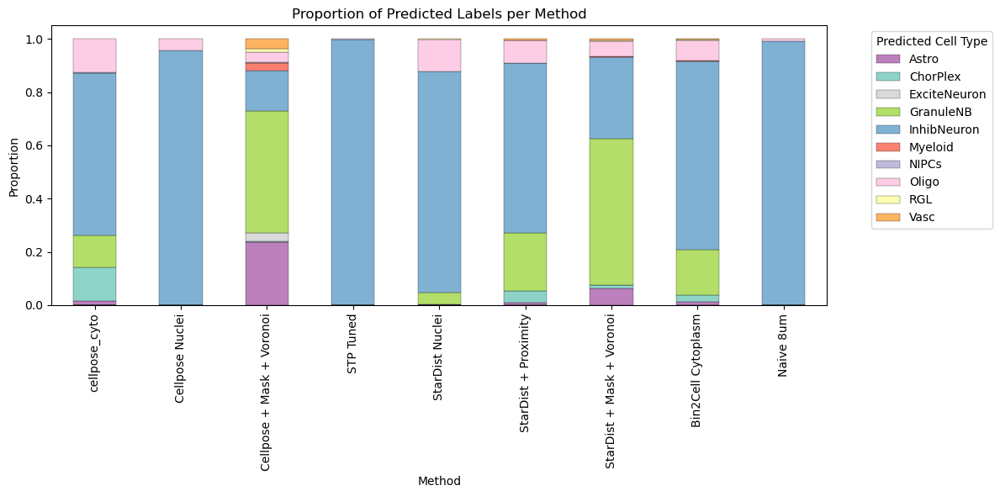

In [23]:
# Collect counts for each method
counts = {}
for key, gdf in data.items():
    gdf = gdf.dropna(subset=['predicted_labels'])
    counts[key] = gdf['predicted_labels'].value_counts()

# Convert to DataFrame
df_counts = pd.DataFrame(counts).fillna(0)


# Normalize to proportions per method
df_props = df_counts.div(df_counts.sum(axis=0), axis=1)
# Filter and reorder data according to plot_order
df_props = df_props[plotting]
# rename for clean plotting
df_props = df_props.rename(columns=lambda x: method_map.get(x, x))

# Sort by label for consistent stacking
df_props = df_props.sort_index()

# Colors
colors = [label_color_map[label] for label in df_props.index]

# Plot
fig, ax = plt.subplots(figsize=(12, 6))

df_props.T.plot(
    kind='bar',
    stacked=True,
    color=colors,
    ax=ax,
    edgecolor="black",
    linewidth=0.2,
)

ax.set_xlabel("Method")
ax.set_ylabel("Proportion")
ax.set_title("Proportion of Predicted Labels per Method")
ax.legend(title="Predicted Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig('cell_type_fig/mouse_brain_celltype_proportions.pdf')
plt.show()
